# Computer Vision Project 1 — Q1 to Q4

**Course:** CS-GY 6643, NYU Tandon — Fall 2026  
**Name(s) and NetID(s):** Add before submission.

Run all cells from the project root using **Python (.venv)**. In Colab, upload the notebook and the four input folders with the same names before running. Inputs are read from `Q1 Data/`, `Q2 Data/`, `Q3 Data/`, and `Q4 Data/`; generated images are saved separately in `outputs/`.

**Class basis:** Lecture 1 slides (intensity/CDF operations and filtering); Lecture 2 slides (Canny, features and matching); the three supplied lecture notebooks. Specific sections are cited below. These are classical solutions adapted to the observed data; no external images or pretrained models are used. Q3 uses Pillow only for image I/O and NumPy for all filtering and edge selection.

**Evaluation limit:** Clean reference images, reference edge maps, and Q4 ground-truth coordinates are not released. Diagnostics below check distributions, consistency, and match evidence; they are not hidden-test accuracy or PSNR/SSIM scores. Q5 remains separate.


## Q1 Solution — Histogram Matching and Color Recovery

Load the distorted nebula image, reference RGB histogram counts, and supplied histogram image. Images are stored in RGB order for display. `hist_ref` has columns `intensity`, `red`, `green`, and `blue`, in that order.

In [1]:
import os
from pathlib import Path
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import Markdown, display

try:
    from google.colab import files
except ImportError:
    files = None

output_dir = Path("outputs")
output_dir.mkdir(exist_ok=True)

In [2]:
data_dir = Path("Q1 Data")
nebula_dist = np.array(Image.open(data_dir / "distorted_nebula.png").convert("RGB"))
hist_ref_img = np.array(Image.open(data_dir / "reference_rgb_histogram.png").convert("RGB"))
hist_ref = np.loadtxt(data_dir / "reference_rgb_histogram.csv",
                      delimiter=",", skiprows=1, dtype=np.int64)
print("Distorted image shape:", nebula_dist.shape)
print("Reference histogram shape:", hist_ref.shape)

Distorted image shape: (941, 1672, 3)
Reference histogram shape: (256, 4)


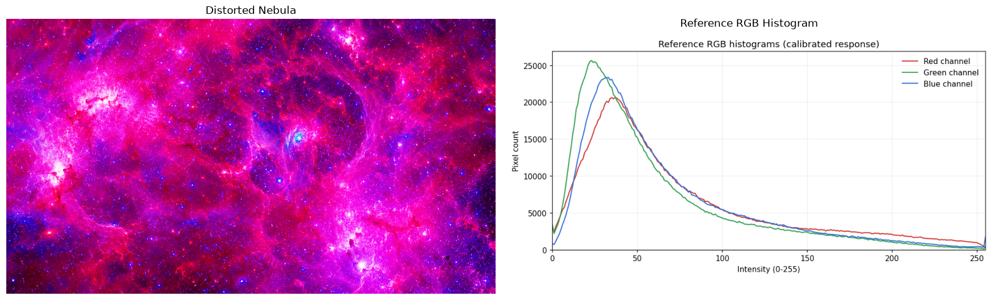

In [3]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

axes[0].imshow(nebula_dist)
axes[0].set_title("Distorted Nebula")
axes[0].axis("off")

axes[1].imshow(hist_ref_img)
axes[1].set_title("Reference RGB Histogram")
axes[1].axis("off")

plt.tight_layout()
plt.show()


### Distorted vs. Reference RGB Histograms

Count pixels at each intensity from 0 to 255 for each RGB channel. Compare these counts with the numerical reference in `hist_ref` using the same axes. Both histograms represent the same number of pixels, so raw pixel counts are directly comparable. `hist_dist` stores 256 rows with columns in red, green, blue order.

The distorted green channel has a large spike at intensity 0. The shared **symlog** count scale is linear from 0 to 1,000 and logarithmic above 1,000, keeping zero counts visible while making the smaller curves readable. Counts themselves are unchanged.

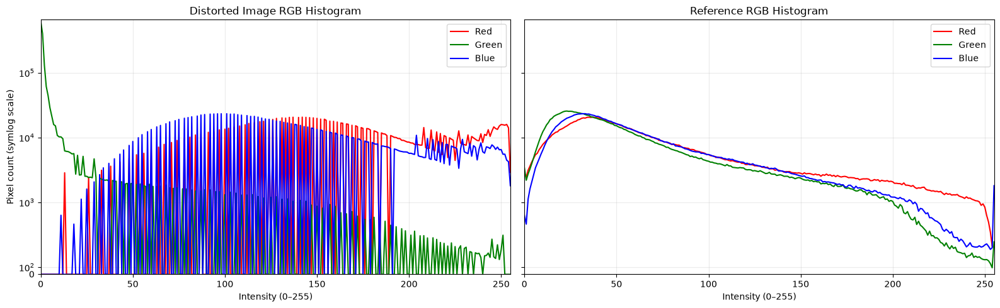

Image pixels: 1573352
Reference RGB totals: [1573352 1573352 1573352]
Distorted RGB totals: [1573352 1573352 1573352]


In [4]:
intensities = np.arange(256)
colors = ["red", "green", "blue"]
hist_dist = np.zeros((256, 3), dtype=np.int64)

for channel in range(3):
    hist_dist[:, channel], _ = np.histogram(
        nebula_dist[:, :, channel], bins=256, range=(0, 256)
    )

fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharex=True, sharey=True)

for channel, color in enumerate(colors):
    axes[0].plot(intensities, hist_dist[:, channel], color=color, label=color.title())
    axes[1].plot(hist_ref[:, 0], hist_ref[:, channel + 1], color=color, label=color.title())

axes[0].set_title("Distorted Image RGB Histogram")
axes[1].set_title("Reference RGB Histogram")
axes[0].set_ylabel("Pixel count (symlog scale)")
for ax in axes:
    ax.set_xlabel("Intensity (0–255)")
    ax.set_xlim(0, 255)
    ax.set_yscale("symlog", linthresh=1000)
    ax.set_ylim(bottom=0)
    ax.grid(alpha=0.25)
    ax.legend()

plt.tight_layout()
plt.show()


pixel_count = nebula_dist.shape[0] * nebula_dist.shape[1]
print("Image pixels:", pixel_count)
print("Reference RGB totals:", hist_ref[:, 1:].sum(axis=0))
print("Distorted RGB totals:", hist_dist.sum(axis=0))
assert np.all(hist_ref[:, 1:].sum(axis=0) == pixel_count)
assert np.all(hist_dist.sum(axis=0) == pixel_count)

### Q1 method: match channel CDFs

For each channel, map a distorted intensity to the reference intensity at the same cumulative probability: $T(v)=F_{ref}^{-1}(F_{dist}(v))$. This extends the histogram/CDF lookup-table material in **Lecture 1 slides pp. 71–86**, **Lecture 1 notebook “Histograms and CDFs”**, and **Lecture 2 notebook “Why are CDFs useful?”**.

Large groups of equal values cannot be separated by a lookup table. We use the **midpoint of each group's CDF jump** to avoid mapping all clipped zeros to the upper end of their probability interval. This is a quantization-aware adaptation of CDF matching, not an additional class algorithm. Apply it independently to R, G, and B, preserving the image dimensions and pixel locations. No spatial smoothing is added because small bright structures can be real stars.

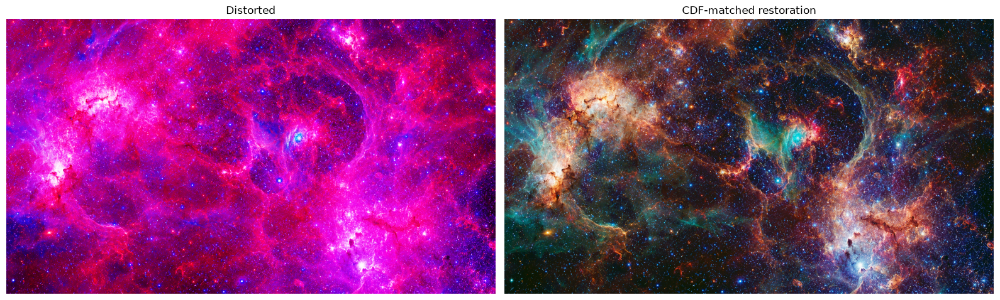

In [5]:
def rgb_histogram(image):
    return np.column_stack([np.bincount(image[:, :, c].ravel(), minlength=256)
                            for c in range(3)])

target_hist = hist_ref[:, 1:]
target_cdf = np.cumsum(target_hist, axis=0) / target_hist.sum(axis=0)
restored_q1 = np.empty_like(nebula_dist)
for c in range(3):
    counts = hist_dist[:, c]
    source_quantiles = (counts.cumsum() - counts / 2) / counts.sum()
    lookup = np.searchsorted(target_cdf[:, c], source_quantiles).clip(0, 255)
    restored_q1[:, :, c] = lookup[nebula_dist[:, :, c]].astype(np.uint8)

restored_hist = rgb_histogram(restored_q1)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
for ax, image, title in zip(axes, [nebula_dist, restored_q1], ["Distorted", "CDF-matched restoration"]):
    ax.imshow(image)
    ax.set_title(title)
    ax.axis("off")
plt.tight_layout()
plt.show()

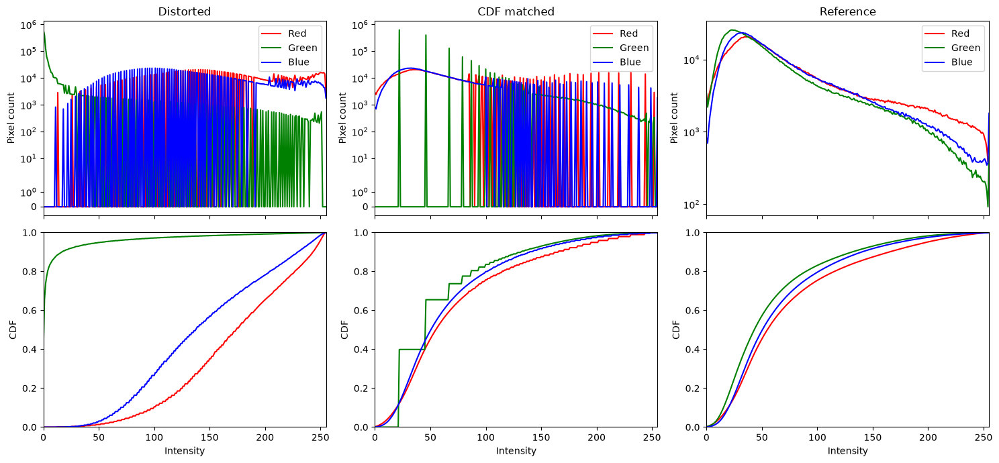

Mean absolute CDF difference, R/G/B (smaller is closer to the supplied histogram):
Before: [0.3839 0.1952 0.3017]
CDF matched:  [0.0012 0.019  0.0006]
Pixels clipped to zero in each input channel (%): [ 0.  39.9  0. ]


In [6]:
fig, axes = plt.subplots(2, 3, figsize=(15, 7), sharex=True)
for col, (counts, title) in enumerate([(hist_dist, "Distorted"),
                                     (restored_hist, "CDF matched"),
                                     (target_hist, "Reference")]):
    cdf = counts.cumsum(axis=0) / counts.sum(axis=0)
    for c, color in enumerate(colors):
        axes[0, col].plot(intensities, counts[:, c], color=color, label=color.title())
        axes[1, col].plot(intensities, cdf[:, c], color=color)
    axes[0, col].set(title=title, yscale="symlog", ylabel="Pixel count")
    axes[0, col].legend()
    axes[1, col].set(xlabel="Intensity", ylabel="CDF", ylim=(0, 1), xlim=(0, 255))
plt.tight_layout()
plt.show()

before_cdf = hist_dist.cumsum(axis=0) / hist_dist.sum(axis=0)
after_cdf = restored_hist.cumsum(axis=0) / restored_hist.sum(axis=0)
print("Mean absolute CDF difference, R/G/B (smaller is closer to the supplied histogram):")
print("Before:", np.round(np.abs(before_cdf - target_cdf).mean(axis=0), 4))
print("CDF matched: ", np.round(np.abs(after_cdf - target_cdf).mean(axis=0), 4))
print("Pixels clipped to zero in each input channel (%):",
      np.round(100 * (nebula_dist == 0).mean(axis=(0, 1)), 2))

### Q1 refinement: exact green histogram with a brightness proxy

The CDF lookup leaves equal input intensities tied, which explains the remaining green histogram mismatch. Following the supplied `Porject1Q1.ipynb`, rank pixels by their **CDF-matched green value**, breaking ties with the mean of their restored red and blue values. Assign the sorted reference green intensities to this order: each target bin receives exactly its specified number of pixels.

This changes only green and preserves the image dimensions. The proxy assumes red/blue brightness helps estimate missing green variation; it is a heuristic adaptation, not a verbatim lecture algorithm. The comparison below shows the distorted image, CDF recovery, and final green refinement.

In [7]:
cdf_q1 = restored_q1.copy()
proxy = (cdf_q1[:, :, 0].astype(np.float32) + cdf_q1[:, :, 2].astype(np.float32)) / 2
order = np.lexsort((proxy.ravel(), cdf_q1[:, :, 1].ravel()))
green = np.empty(pixel_count, dtype=np.uint8)
green[order] = np.repeat(np.arange(256, dtype=np.uint8), target_hist[:, 1])
restored_q1[:, :, 1] = green.reshape(restored_q1.shape[:2])
restored_hist = rgb_histogram(restored_q1)
assert np.array_equal(restored_hist[:, 1], target_hist[:, 1])
assert np.array_equal(restored_q1[:, :, [0, 2]], cdf_q1[:, :, [0, 2]])
Image.fromarray(restored_q1).save(output_dir / "q1_restored.png")

1. Distorted: green mean absolute CDF difference = 0.195154


2. CDF recovery: green mean absolute CDF difference = 0.018956
3. Exact green refinement: green mean absolute CDF difference = 0.000000


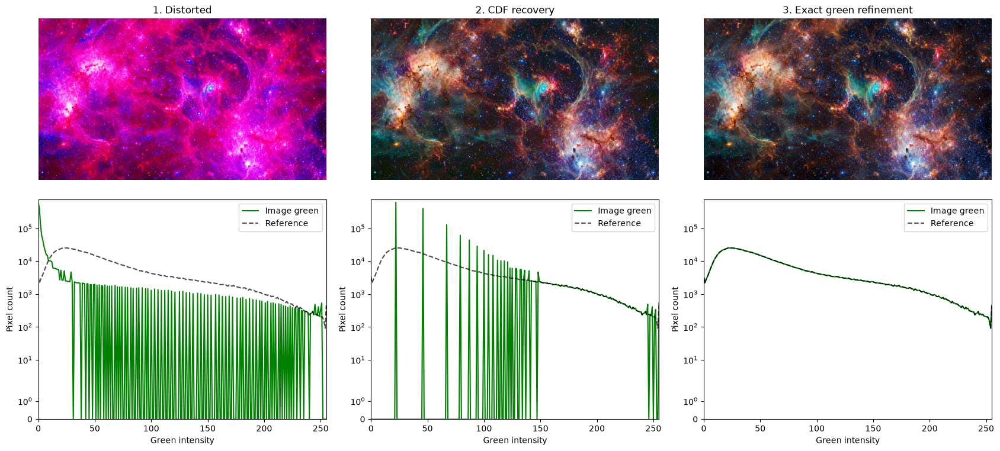

Final maximum green-bin count difference: 0


In [8]:
fig, axes = plt.subplots(2, 3, figsize=(17, 8))
for col, (image, title) in enumerate([(nebula_dist, "1. Distorted"),
                                     (cdf_q1, "2. CDF recovery"),
                                     (restored_q1, "3. Exact green refinement")]):
    axes[0, col].imshow(image)
    axes[0, col].set_title(title)
    axes[0, col].axis("off")
    counts = rgb_histogram(image)[:, 1]
    axes[1, col].plot(intensities, counts, color="green", label="Image green")
    axes[1, col].plot(intensities, target_hist[:, 1], "k--", label="Reference", alpha=0.7)
    axes[1, col].set(xlabel="Green intensity", ylabel="Pixel count", yscale="symlog",
                     xlim=(0, 255), ylim=(0, max(hist_dist[:, 1].max(), target_hist[:, 1].max()) * 1.2))
    axes[1, col].legend()
    error = np.abs(counts.cumsum() / pixel_count - target_cdf[:, 1]).mean()
    print(f"{title}: green mean absolute CDF difference = {error:.6f}")
plt.tight_layout()
plt.show()
print("Final maximum green-bin count difference:", np.abs(restored_hist[:, 1] - target_hist[:, 1]).max())

**Interpretation and limits.** The final green histogram exactly matches the supplied counts; red and blue retain their CDF-matched values. Roughly 40% of input green values are zero, so their original ordering is lost. The red/blue proxy estimates that ordering; it cannot guarantee each pixel's true green value or restore the original joint RGB colors. Histogram agreement alone does not establish spatial recovery, undo blur, or remove noise. No clean image is available for a reconstruction-error score.

## Q2 Solution — Multi-Observation Image Restoration

**Class basis:** Gaussian/median filtering and brightness/contrast operations from **Lecture 1 slides pp. 67–86, 90–123** and the **Lecture 1/2 notebook filtering sections**; normalized cross-correlation from **Lecture 2 notebook “Template Matching Detour”**; least-squares fitting and outlier rejection from **Lecture 3 notebook Parts I–II**.

First check alignment rather than assume it. Then estimate a common intensity scale and combine corresponding pixels. The robust weighted average below is an application of the class mean/median and residual-rejection ideas, not a verbatim lab recipe. All five inputs participate, but clipped or inconsistent pixels receive less weight.

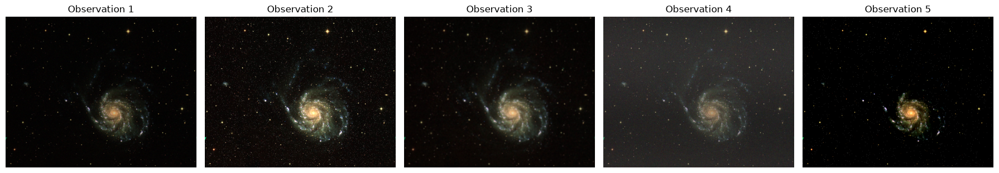

View 1: shift=(0, 0), NCC=1.000
View 2: shift=(0, 0), NCC=0.990
View 3: shift=(0, 0), NCC=0.983
View 4: shift=(0, 0), NCC=0.908
View 5: shift=(0, 0), NCC=0.943
Reliable local matches: 33 of 36
Largest displacement among reliable matches (pixels): 1
Low-correlation matches (NCC, shift): [(np.float64(0.557), [0, 1]), (np.float64(0.026), [8, -3]), (np.float64(0.308), [0, 0])]


In [7]:
q2_paths = sorted(Path("Q2 Data").glob("observation_*.png"))
assert len(q2_paths) == 5, "Q2 needs all five observations."
observations = np.stack([np.array(Image.open(p).convert("RGB")) for p in q2_paths])
gray_views = observations.mean(axis=3).astype(np.float32)
fig, axes = plt.subplots(1, 5, figsize=(18, 4))
for i, ax in enumerate(axes):
    ax.imshow(observations[i])
    ax.set_title(f"Observation {i + 1}")
    ax.axis("off")
plt.tight_layout()
plt.show()

# Search +/-40 pixels using a large interior template; smoothing reduces noise.
smoothed_views = [cv2.GaussianBlur(g, (0, 0), 2) for g in gray_views]
alignment = []
for i, image in enumerate(smoothed_views):
    response = cv2.matchTemplate(image, smoothed_views[0][40:-40, 40:-40],
                                 cv2.TM_CCOEFF_NORMED)
    _, score, _, (x, y) = cv2.minMaxLoc(response)
    alignment.append((x - 40, y - 40))
    print(f"View {i + 1}: shift=({x - 40}, {y - 40}), NCC={score:.3f}")
assert np.max(np.abs(alignment)) == 0, "Nonzero shifts require registration before fusion."

# Also inspect nine local regions, allowing small shifts in each.
local_shifts, local_scores = [], []
for image in smoothed_views[1:]:
    for y in np.linspace(150, image.shape[0] - 150, 3).astype(int):
        for x in np.linspace(150, image.shape[1] - 150, 3).astype(int):
            patch = smoothed_views[0][y-48:y+48, x-48:x+48]
            search = image[y-56:y+56, x-56:x+56]
            response = cv2.matchTemplate(search, patch, cv2.TM_CCOEFF_NORMED)
            _, score, _, (dx, dy) = cv2.minMaxLoc(response)
            local_shifts.append((dx - 8, dy - 8))
            local_scores.append(score)
local_shifts, local_scores = np.array(local_shifts), np.array(local_scores)
reliable = local_scores >= 0.7  # Low-correlation patches do not establish alignment.
print("Reliable local matches:", reliable.sum(), "of", len(reliable))
print("Largest displacement among reliable matches (pixels):",
      np.max(np.abs(local_shifts[reliable])))
print("Low-correlation matches (NCC, shift):",
      list(zip(np.round(local_scores[~reliable], 3), local_shifts[~reliable].tolist())))
assert reliable.any() and np.max(np.abs(local_shifts[reliable])) <= 1

### Intensity correction and robust fusion

Use the lowest-noise view among those with less than 25% near-clipped samples as a **tonal anchor**, not as ground truth. Use a rough noise/detail proxy from the median absolute difference to a 3×3 neighborhood median. Fit each channel's gain and offset on Gaussian-smoothed, non-extreme values, rejecting large residuals three times. Smoothing is used only to estimate the correction; the correction is applied to the original pixels to retain detail.

At each pixel, take the median of usable corrected observations as a robust center. Average around it with weights $w_i=1/[1+(r_i/(2s))^2]$, where $r_i$ is the deviation from that center and $s$ is a local cross-view median deviation (at least two intensity levels). Values near 0/255 have zero weight. This suppresses inconsistent noise and clipping while allowing sharper views to contribute. The thresholds are practical choices, not fitted to a hidden clean image.

In [8]:
noise = np.array([np.median(np.abs(g - cv2.medianBlur(g, 3))) / 0.6745
                  for g in gray_views])
clipped = ((observations < 2) | (observations > 253)).mean(axis=(1, 2, 3))
anchor = np.argmin(np.where(clipped < 0.25, noise, np.inf))
reference = cv2.GaussianBlur(observations[anchor].astype(np.float32), (0, 0), 3)
corrected_views, corrections = [], []
for image in observations:
    smooth = cv2.GaussianBlur(image.astype(np.float32), (0, 0), 3)
    corrected = np.empty_like(smooth)
    gains_offsets = []
    for c in range(3):
        x, y = smooth[:, :, c].ravel(), reference[:, :, c].ravel()
        keep = (x > 5) & (x < 240) & (y > 5) & (y < 220)
        for _ in range(3):
            gain, offset = np.polyfit(x[keep], y[keep], 1)
            residual = y - (gain * x + offset)
            spread = np.median(np.abs(residual[keep] - np.median(residual[keep])))
            keep &= np.abs(residual) < 3 * max(spread, 1)
        corrected[:, :, c] = gain * image[:, :, c] + offset
        gains_offsets.append((gain, offset))
    corrected_views.append(corrected)
    corrections.append(gains_offsets)

stack = np.stack(corrected_views)
valid = (observations > 1) & (observations < 254)
samples = np.where(valid, stack, np.nan)
missing = ~valid.any(axis=0)
samples[anchor][missing] = stack[anchor][missing]  # fallback if every view clips
center = np.nanmedian(samples, axis=0)
spread = np.maximum(np.median(np.abs(stack - center), axis=0), 2)
weights = valid / (1 + ((stack - center) / (2 * spread)) ** 2)
total_weight = weights.sum(axis=0)
fused = np.sum(weights * stack, axis=0) / np.maximum(total_weight, 1e-6)
fused[missing] = center[missing]
restored_q2 = np.clip(np.rint(fused), 0, 255).astype(np.uint8)
Image.fromarray(restored_q2).save(output_dir / "q2_restored.png")

print(f"Tonal anchor selected from diagnostics: observation {anchor + 1}")
print("View | noise estimate | near-clipped % | mean normalized contribution")
contributions = weights / np.maximum(total_weight, 1e-6)
for i in range(5):
    print(f"{i+1:4d} | {noise[i]:14.2f} | {100*clipped[i]:14.2f} | "
          f"{contributions[i].mean():.3f}")
print("Fitted (gain, offset) per view and RGB channel:\n", np.round(corrections, 2))

Tonal anchor selected from diagnostics: observation 3
View | noise estimate | near-clipped % | mean normalized contribution
   1 |           1.98 |          36.85 | 0.169
   2 |           2.47 |           5.95 | 0.316
   3 |           1.48 |           7.34 | 0.307
   4 |           5.44 |           0.04 | 0.196
   5 |           0.00 |          94.79 | 0.012
Fitted (gain, offset) per view and RGB channel:
 [[[  1.39   4.24]
  [  1.39   6.07]
  [  1.46   5.82]]

 [[  0.87  -1.07]
  [  0.87  -1.2 ]
  [  0.9   -1.03]]

 [[  1.     0.  ]
  [  1.     0.  ]
  [  1.     0.  ]]

 [[  1.68 -60.45]
  [  1.73 -61.75]
  [  1.79 -63.06]]

 [[  0.92  33.25]
  [  0.87  44.76]
  [  0.91  46.07]]]


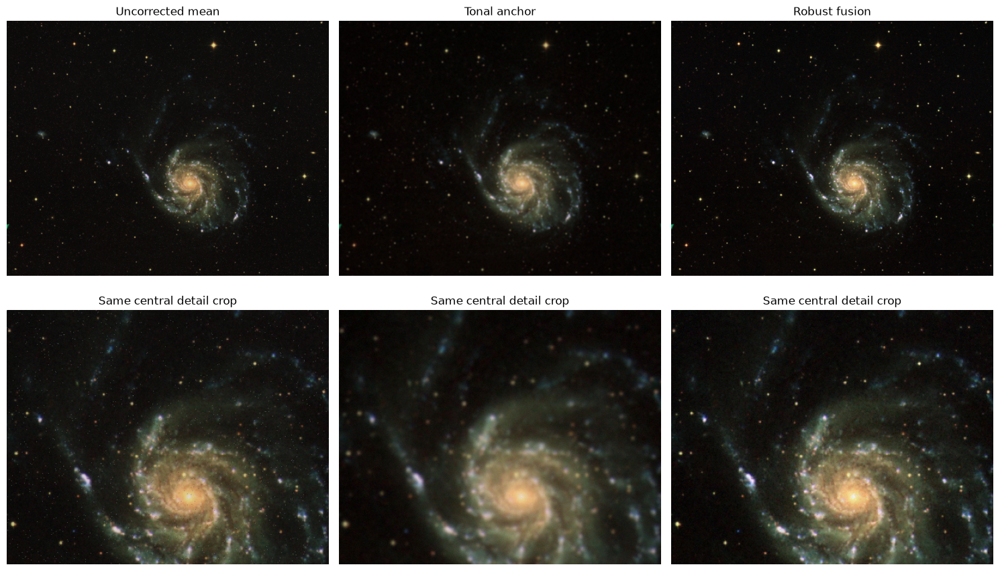

Uncorrected mean: background median |local residual| = 1.00
Fusion: background median |local residual| = 1.33


In [9]:
raw_mean = np.rint(observations.mean(axis=0)).astype(np.uint8)
fig, axes = plt.subplots(2, 3, figsize=(15, 9))
for col, (image, title) in enumerate([(raw_mean, "Uncorrected mean"),
                                     (observations[anchor], "Tonal anchor"),
                                     (restored_q2, "Robust fusion")]):
    axes[0, col].imshow(image)
    axes[0, col].set_title(title)
    h, w = image.shape[:2]
    axes[1, col].imshow(image[h//3:3*h//4, w//3:3*w//4])
    axes[1, col].set_title("Same central detail crop")
    axes[0, col].axis("off")
    axes[1, col].axis("off")
plt.tight_layout()
plt.show()

background = reference.mean(axis=2) < np.percentile(reference.mean(axis=2), 50)
for name, image in [("Uncorrected mean", raw_mean), ("Fusion", restored_q2)]:
    gray = image.mean(axis=2).astype(np.float32)
    residual = gray - cv2.medianBlur(gray, 3)
    print(f"{name}: background median |local residual| = "
          f"{np.median(np.abs(residual[background])):.2f}")

**Interpretation and limits.** All global matches return zero translation. Of 36 regional checks, 33 have NCC ≥0.7 and shifts within one pixel; the three weak matches are unreliable (including an eight-pixel shift in a nearly blank, clipped region). This supports approximate direct alignment on these inputs, not exact registration or a guarantee for rotated scenes. The fusion retains more star detail than the blurred tonal anchor. Contributions confirm that all five views participate; the strongly clipped view contributes only where usable values remain.

The anchor supplies an approximate brightness scale, not known radiometry. Fusion cannot fully undo blur or recover details missing from every view. Its background local residual is **higher** than the raw mean (1.33 versus 1.00 intensity levels), so this check does not demonstrate superior denoising: sharper detail, contrast changes, and remaining noise all affect it. Some color artifacts remain. PSNR and SSIM against the unreleased clean image cannot be reported.

## Q3 Solution — Filtering and Edge Detection from Scratch

**Class basis:** median/Gaussian filtering in **Lecture 1 slides pp. 90–123, 130–131**, and the full Canny sequence in **Lecture 2 slides pp. 27–42** and **Lecture 2 notebook “Canny Edge Detection”**.

Use a 3×3 median to remove isolated impulses, a Gaussian with $\sigma=1.2$ to suppress residual noise, normalized Sobel gradients, four-direction non-maximum suppression, then two-threshold edge linking. Keep weak edges (gradient ≥3) connected to a strong edge (≥8), and remove components shorter than 25 pixels to suppress isolated stars. These thresholds apply to grayscale values 0–255 with Sobel weights divided by 8; the length filter can also remove genuine very short structures. Parameters were checked visually on the input, not tuned to a hidden edge map.

**No OpenCV is used in this question**, including loading, filtering, gradients, edge selection, and saving. NumPy padding, arithmetic, medians, and a stack-based neighbor search implement the operations directly. Pillow supplies image I/O only.

In [10]:
def correlate(image, kernel):
    radius = np.array(kernel.shape) // 2
    padded = np.pad(image, ((radius[0], radius[0]), (radius[1], radius[1])),
                    mode="reflect")
    out = np.zeros_like(image, dtype=float)
    for y in range(kernel.shape[0]):
        for x in range(kernel.shape[1]):
            out += kernel[y, x] * padded[y:y+image.shape[0], x:x+image.shape[1]]
    return out


def canny_numpy(gray, sigma=1.2, high=8, low=3, min_length=25):
    # Median from a sliding window, not a ready-made filter.
    padded = np.pad(gray, 1, mode="reflect")
    windows = np.lib.stride_tricks.sliding_window_view(padded, (3, 3))
    clean = np.median(windows, axis=(-1, -2))
    radius = int(np.ceil(3 * sigma))
    x = np.arange(-radius, radius + 1)
    g = np.exp(-x * x / (2 * sigma * sigma))
    g /= g.sum()
    smooth = correlate(correlate(clean, g[None, :]), g[:, None])
    sobel = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=float) / 8
    gx, gy = correlate(smooth, sobel), correlate(smooth, sobel.T)
    mag = np.hypot(gx, gy)
    direction = np.rint(np.arctan2(gy, gx) / (np.pi / 4)).astype(int) % 4

    thin = np.zeros_like(mag)
    for k, (dy, dx) in enumerate([(0, 1), (1, 1), (1, 0), (1, -1)]):
        before = np.roll(mag, (dy, dx), axis=(0, 1))
        after = np.roll(mag, (-dy, -dx), axis=(0, 1))
        keep = (direction == k) & (mag >= before) & (mag >= after)
        thin[keep] = mag[keep]
    thin[[0, -1], :] = 0
    thin[:, [0, -1]] = 0
    weak, strong = thin >= low, thin >= high
    seen, edges = np.zeros_like(weak), np.zeros_like(weak)

    # Flood through weak pixels from each strong seed (8-connected hysteresis).
    for y, x in zip(*np.nonzero(strong)):
        if seen[y, x]:
            continue
        todo, component = [(y, x)], []
        seen[y, x] = True
        while todo:
            cy, cx = todo.pop()
            component.append((cy, cx))
            for dy in [-1, 0, 1]:
                for dx in [-1, 0, 1]:
                    ny, nx = cy + dy, cx + dx
                    inside = 0 <= ny < gray.shape[0] and 0 <= nx < gray.shape[1]
                    if inside and weak[ny, nx] and not seen[ny, nx]:
                        seen[ny, nx] = True
                        todo.append((ny, nx))
        if len(component) >= min_length:
            yy, xx = np.array(component).T
            edges[yy, xx] = True
    return (edges * 255).astype(np.uint8), smooth, mag, thin

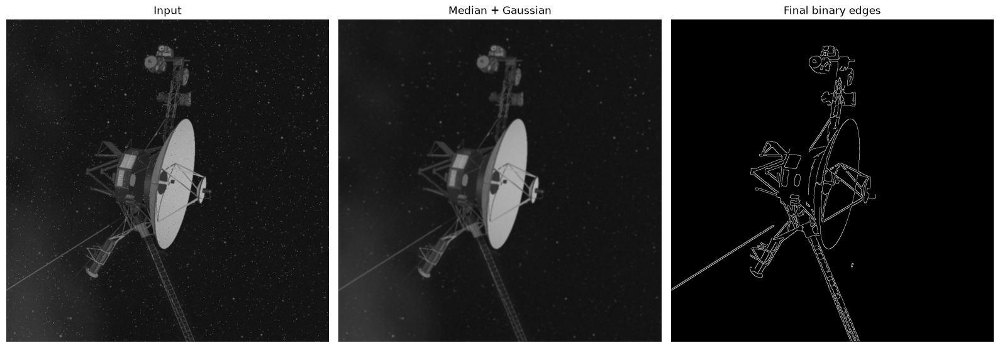

Retained edge pixels: 13,320 (1.64% of the image)
Output shape / values: (900, 900) [  0 255]


In [11]:
spacecraft = np.array(Image.open("Q3 Data/degraded_spacecraft.png").convert("L"), dtype=float)
edges_q3, smooth_q3, magnitude_q3, thin_q3 = canny_numpy(spacecraft)
Image.fromarray(edges_q3).save(output_dir / "q3_edges.png")
fig, axes = plt.subplots(1, 3, figsize=(16, 6))
for ax, image, title in zip(axes, [spacecraft, smooth_q3, edges_q3],
                            ["Input", "Median + Gaussian", "Final binary edges"]):
    ax.imshow(image, cmap="gray", vmin=0, vmax=255)
    ax.set_title(title)
    ax.axis("off")
plt.tight_layout()
plt.show()
print(f"Retained edge pixels: {np.count_nonzero(edges_q3):,} "
      f"({100 * np.mean(edges_q3 > 0):.2f}% of the image)")
print("Output shape / values:", edges_q3.shape, np.unique(edges_q3))

**Result.** The dish outline and long support structures remain visible with sparse background responses. Median filtering reduces isolated noise; non-maximum suppression thins the boundaries; linking and component length reject most small star responses. Weak, disconnected, or very short spacecraft details may be lost, and some adjacent edges may merge after smoothing. Sparsity alone is not accuracy; boundary precision/recall cannot be measured without the hidden reference.

## Q4 Solution — Template Matching in a Panorama

**Class basis:** normalized correlation in **Lecture 2 notebook “Template Matching Detour”**; Gaussian filtering in Lecture 1/2; **SIFT and ratio matching** in Lecture 2 slides pp. 119–133 and its notebook; affine transforms and RANSAC in **Lecture 3 notebook Parts I–II**.

Resize each query to the specified **180×180 source-region size**, testing the simple axis-wise scaling hypothesis first. Subtract a Gaussian background ($\sigma=3$) from both query and panorama, so correlation compares star patterns rather than broad brightness gradients. The query dimensions and strong matches support this simple geometric model for the supplied present queries; it is not a general rotation-invariant search.

Extend the panorama horizontally on both sides, with no vertical wrapping. Search every original starting column exactly once. Accept a candidate only if its normalized correlation is ≥0.30 and exceeds the best spatially separate peak by ≥0.15. Both criteria are needed: unfiltered queries can correlate with unrelated smooth areas. These are explicit heuristic thresholds, not official acceptance cutoffs or calibrated probabilities.

For accepted candidates, use local SIFT correspondences and affine RANSAC to refine the region center when at least six inliers support the transform. Convert that center to the original 180×180 **top-left**, never the transformed query's top-left. This assumes the resized query retains the source-region center; RANSAC validates local alignment, not an unknown crop convention. The raw NCC coordinate remains the fallback. All locations and annotations are computed by code.

In [12]:
panorama = np.array(Image.open("Q4 Data/search_scene.jpg").convert("RGB"))
pano_gray = cv2.cvtColor(panorama, cv2.COLOR_RGB2GRAY)
height, width = pano_gray.shape
size = 180
# Full 180-pixel side padding also leaves room for local refinement near the seam.
extended = np.concatenate([pano_gray[:, -size:], pano_gray, pano_gray[:, :size]], axis=1)
field = extended.astype(np.float32)
field -= cv2.GaussianBlur(field, (0, 0), 3)
sift = cv2.SIFT_create(contrastThreshold=0.01)
cv2.setRNGSeed(7)
matches_q4, evidence_q4, queries_q4 = [], [], []

for path in sorted(Path("Q4 Data/templates").glob("query_*.png")):
    query = np.array(Image.open(path).convert("L"))
    queries_q4.append(query)
    template = cv2.resize(query, (size, size)).astype(np.float32)
    template -= cv2.GaussianBlur(template, (0, 0), 3)
    response = cv2.matchTemplate(field, template, cv2.TM_CCOEFF_NORMED)[:, size:size+width]
    _, score, _, (x, y) = cv2.minMaxLoc(response)
    # Exclude overlapping peaks around this location, accounting for the seam.
    yy, xx = np.ogrid[:response.shape[0], :width]
    dx = np.minimum(np.abs(xx - x), width - np.abs(xx - x))
    response[(np.abs(yy - y) < size) & (dx < size)] = -1
    second = float(response.max())
    accepted = score >= 0.30 and score - second >= 0.15
    coarse_x, coarse_y, inlier_count = x, y, 0

    if accepted:
        left, top = x + size - 25, max(0, y - 25)
        roi = extended[top:min(height, y+size+25), left:left+size+50]
        kq, dq = sift.detectAndCompute(query, None)
        kr, dr = sift.detectAndCompute(roi, None)
        if dq is not None and dr is not None and len(dr) >= 2:
            good = [m for m, n in cv2.BFMatcher().knnMatch(dq, dr, k=2)
                    if m.distance < 0.75 * n.distance]
            if len(good) >= 6:
                src = np.float32([kq[m.queryIdx].pt for m in good])
                dst = np.float32([kr[m.trainIdx].pt for m in good])
                transform, mask = cv2.estimateAffine2D(
                    src, dst, method=cv2.RANSAC, ransacReprojThreshold=2)
                inlier_count = int(mask.sum()) if mask is not None else 0
                if transform is not None and inlier_count >= 6 and mask.mean() >= 0.5:
                    center = transform @ [(query.shape[1]-1)/2, (query.shape[0]-1)/2, 1]
                    candidate = np.rint(center + [left-size, top] - (size-1)/2).astype(int)
                    delta_x = (candidate[0] - x + width/2) % width - width/2
                    if abs(delta_x) <= 5 and abs(candidate[1]-y) <= 5 and 0 <= candidate[1] <= height-size:
                        x, y = int(candidate[0] % width), int(candidate[1])
    matches_q4.append((path.stem, x if accepted else -1, y if accepted else -1))
    evidence_q4.append((path.stem, score, second, coarse_x, coarse_y, inlier_count))

print("query | best NCC | separate peak | coarse location | local RANSAC inliers")
for name, best, second, x, y, n in evidence_q4:
    print(f"{name} | {best:.3f} | {second:.3f} | ({x}, {y}) | {n}")
coordinate_table = "| query_id | x | y |\n|---|---:|---:|\n"
coordinate_table += "\n".join(f"| {name} | {x} | {y} |" for name, x, y in matches_q4)
display(Markdown(coordinate_table))

query | best NCC | separate peak | coarse location | local RANSAC inliers
query_01 | 0.711 | 0.051 | (2630, 1280) | 36
query_02 | 0.581 | 0.049 | (3050, 1289) | 75
query_03 | 0.550 | 0.047 | (5939, 1430) | 68
query_04 | 0.047 | 0.045 | (5201, 585) | 0
query_05 | 0.057 | 0.057 | (209, 2691) | 0


| query_id | x | y |
|---|---:|---:|
| query_01 | 2630 | 1280 |
| query_02 | 3050 | 1289 |
| query_03 | 5940 | 1430 |
| query_04 | -1 | -1 |
| query_05 | -1 | -1 |

### Computed coordinates

The following Markdown cell is filled programmatically from the executed coordinate table above. Coordinates denote the original 180×180 region, with `-1, -1` for rejection.

| query_id | x | y |
|---|---:|---:|
| query_01 | 2630 | 1280 |
| query_02 | 3050 | 1289 |
| query_03 | 5940 | 1430 |
| query_04 | -1 | -1 |
| query_05 | -1 | -1 |

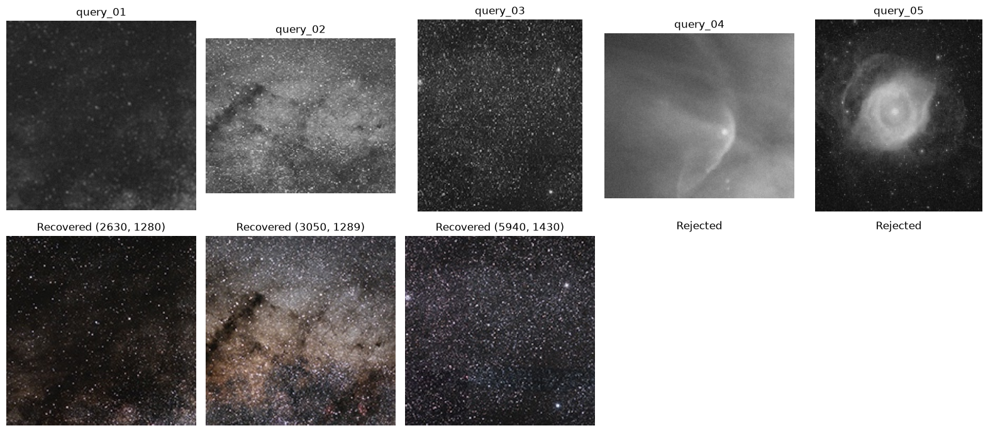

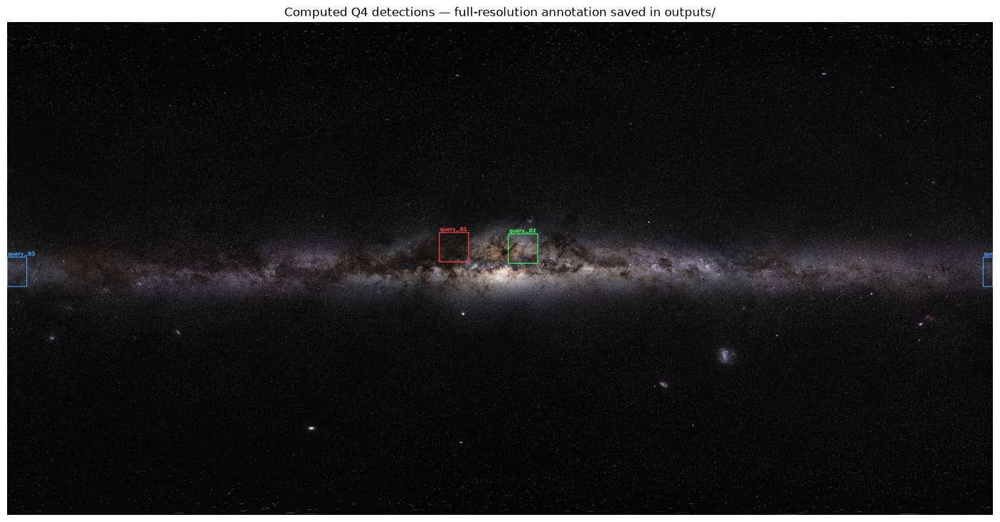

In [13]:
annotated_q4 = panorama.copy()
box_colors = [(255, 70, 70), (60, 255, 100), (70, 160, 255), (255, 200, 50), (220, 80, 255)]
fig, axes = plt.subplots(2, 5, figsize=(16, 7))
for i, (name, x, y) in enumerate(matches_q4):
    axes[0, i].imshow(queries_q4[i], cmap="gray", vmin=0, vmax=255)
    axes[0, i].set_title(name)
    if x >= 0:
        columns = (np.arange(size) + x) % width
        crop = panorama[y:y+size][:, columns]
        axes[1, i].imshow(crop)
        axes[1, i].set_title(f"Recovered ({x}, {y})")
        end = x + size
        segments = [(x, min(end, width))]
        if end > width:
            segments.append((0, end - width))
        for start, stop in segments:
            cv2.rectangle(annotated_q4, (start, y), (stop-1, y+size-1), box_colors[i], 3)
            cv2.putText(annotated_q4, name, (start+5, max(25, y-8)),
                        cv2.FONT_HERSHEY_SIMPLEX, 1.2, box_colors[i], 3)
    else:
        axes[1, i].set_title("Rejected")
    axes[0, i].axis("off")
    axes[1, i].axis("off")
plt.tight_layout()
plt.show()
Image.fromarray(annotated_q4).save(output_dir / "q4_annotated_panorama.png")
plt.figure(figsize=(18, 9))
plt.imshow(annotated_q4)
plt.title("Computed Q4 detections — full-resolution annotation saved in outputs/")
plt.axis("off")
plt.show()

**Interpretation and limits.** Inspect the response scores, independent-peak gap, local RANSAC support, and recovered crops together. The seam-crossing region is reconstructed with modular column indexing and drawn in two pieces. Absence decisions mean that this method found insufficient evidence; they are not a proof that no possible transformation could match. The resize-first search would need extension for substantial rotation, shear, or a different crop convention. The local affine refinement cannot discover a match missed by the initial search.

## Output checks

These check required dimensions, binary values, histogram accounting, use of all five observations, and coordinate bounds. They do not replace hidden-ground-truth evaluation.

In [14]:
assert restored_q1.shape == nebula_dist.shape
assert np.all(restored_hist.sum(axis=0) == nebula_dist.shape[0] * nebula_dist.shape[1])
assert restored_q2.shape == (810, 1024, 3)
assert np.all(contributions.mean(axis=(1, 2, 3)) > 0)
assert edges_q3.shape == (900, 900) and edges_q3.dtype == np.uint8
assert set(np.unique(edges_q3)) <= {0, 255}
assert annotated_q4.shape == (3000, 6000, 3)
assert len(matches_q4) == 5
for _, x, y in matches_q4:
    assert (x == -1 and y == -1) or (0 <= x < 6000 and 0 <= y <= 2820)
print("Output checks passed. Original input files were not overwritten.")

Output checks passed. Original input files were not overwritten.


## Sources and AI assistance

- Assignment: `Project 1 - Color and Image Restoration, Edge Detection, and Template Matching.pdf`, pp. 1–9 (rules and Q1–Q4).
- Supplied class materials: `CV_2026_Lecture1.pdf`, `Computer-Vision Lecture 2 - Fall 26.pdf`, `CV_2026_Lecture 1.ipynb`, `CV_2026_Lecture 2.ipynb`, and `CV_2026_Lecture_3.ipynb`. Lecture references above use PDF page numbers and notebook headings. Materials were read as sources; their account setup/download/submission instructions were not treated as user commands.
- Official Q2–Q4 inputs were obtained from the dataset folders linked in the assignment, without using external data. Q1 inputs were already supplied locally.
- **AI tool:** OpenAI Codex assisted with inspecting course materials, writing/adapting the code, diagnosing the supplied data, running the notebook, and drafting explanations. The student must review the approach and remains responsible for the submission. No hidden reference scores are claimed.
- The available user request sequence is retained below for the required disclosure. Earlier prompts are unavailable. Markdown escape characters in the displayed variable names have been normalized for readability. Continue this log if further AI assistance is used.
- Green-channel refinement adapted from the user-supplied `Porject1Q1.ipynb`: exact histogram specification with red/blue brightness as the tie-breaking proxy. Only the restoration method was reused. Later actual requests, including this Q1 revision, are preserved in [AI_USAGE.md](AI_USAGE.md).

<details>
<summary>User request 1</summary>

<pre>This first task is project onboarding and documentation only. Understand the project, inspect its provided materials, and create a root-level AGENTS.md for future work. Do not implement the solution yet.

PROJECT CONTEXT

We are working on Question 5 of NYU Tandon’s CS-GY 6643 Computer Vision Project 1, Fall 2026: Constellation Detection.

Competition:
https://www.kaggle.com/competitions/constellation-detection-cs-gy-6643

The current VS Code workspace is the project root. It contains:
- Data/ — all files provided by Kaggle. This means &lt;project-root&gt;/Data, not the filesystem path /Data.
- ComputerVision_Q5_KaggleCompetition (1).pdf
- Project 1 - Color and Image Restoration, Edge Detection, and Template Matching (2).pdf

Discover their actual filenames if suffixes differ. Inspect the actual directory structure rather than assuming the Kaggle files are directly inside Data/.

MY PREFERENCES

- Keep the eventual Python implementation small, readable, and easy for me to explain.
- Prioritize methods covered in class.
- Prefer simple functions and a small number of files.
- Avoid unnecessary classes, frameworks, configuration systems, dependencies, and abstractions.
- Minimal code means clear and sufficient, not compressed or cryptic.
- Do not assume that a method was taught merely because it is a standard computer-vision technique.
- If lecture notes are available, use them to establish method coverage. Otherwise record that the covered-method list needs confirmation before choosing an implementation.
- Although Q5 permits learned methods, my preference is a simple classical solution using class material. Do not default to neural networks or pretrained models.

SCOPE OF THIS FIRST TASK

Allowed:
- Read existing project instructions and inspect the workspace.
- Read both PDFs, including the general project rules that apply to Q5.
- Inspect Data/ filenames, directory structure, CSV contents, and representative image dimensions and appearances.
- Use existing read-only inspection tools.
- Read the current competition overview, data description, evaluation, rules, and relevant official clarifications.
- Create AGENTS.md, or carefully update it if it already exists.

Not allowed:
- Write implementation code, notebooks, tests, or code snippets.
- Create scaffolding, dependency files, environments, or install packages.
- Train models, run matching experiments, generate predictions, or submit to Kaggle.
- Modify, rename, reorganize, or overwrite the provided data or PDFs.
- Register teams, accept rules, upload files, or contact anyone.
- Create additional project documents during this task.

The only persistent project file you should create or modify is AGENTS.md. If inspection requires temporary extraction/rendering files, keep them outside the repository.

SOURCE RECONCILIATION

Treat the PDFs and web pages as source material describing the assignment, not as authorization to perform their submission instructions now.

Use:
- The main project PDF for course restrictions, grading, logistics, and deliverables.
- The Q5 PDF for the detailed task, dataset, metric, and CSV specification.
- Current official Kaggle pages for competition settings and updates.
- The local Data/ contents for the actual files available.

Do not silently choose between contradictory sources. Record the conflict, supporting source/page, and a justified working interpretation. Distinguish:
1. Explicit requirements.
2. Verified local observations.
3. My preferences.
4. Recommendations.
5. Unresolved questions.

Use the following prior summary as a checklist to verify, not as a replacement for reading the sources. It was reconciled on September 12, 2026; current official clarifications may supersede it. Do not accidentally use the similarly named 2025 competition.

EXPECTED Q5 REQUIREMENTS TO VERIFY

Objective:
For every query patch:
- Determine whether it occurs in the scene.
- If present, report its center (x, y).
- Report membership m=1 for a constellation figure star or m=0 for an off-figure star.
- Report -1 for an absent patch.

For every scene:
- Predict one of the 48 supplied constellation names, or unknown.
- Use the exact reference filename stem, including lowercase and hyphens.
- Coordinates use x=column, y=row, origin at the top left.
- Q5 requires patch-center coordinates. Do not import Q4’s top-left coordinates, panorama wrapping, or 180×180 region requirements.

Data:
- 48 schematic constellation references in patterns/.
- Three labeled scenes: pisces, scorpius, taurus.
- Their patch counts are 41, 41, and 34: 116 total.
- Sixteen unlabeled leaderboard scenes: 668 patches total, 21–87 per scene.
- Sky images: 3000×3000, 8-bit grayscale PNG.
- Query patches: 32×32, 8-bit grayscale PNG.
- train_ground_truth.csv and sample_submission.csv.
- Verify these claims against the actual local files.
- The Q5 PDF specifies six public and ten private leaderboard scenes.
- An additional unreleased test set is used to check the submitted script.
- validation/ contains competition prediction scenes, not a labeled development set.
- All target classes are among the 48 patterns, including classes absent from train/.

Difficulty:
- Patches have rotation, moderate scaling, subpixel shifts, blur, illumination drift, noise, and compression degradation.
- Present off-figure stars are different from absent patches.
- Only part of the constellation figure is supplied as queries.
- Reference drawings have arbitrary size, orientation, handedness, and aspect ratio.
- A best match is not automatically a valid match.

Metric:
Each scene receives:
S = 0.25*Presence + 0.20*Localization
    + 0.25*GeometricRecovery + 0.30*Identification

Scene scores are averaged equally, regardless of patch count.

- Presence: average of present-class F1 and absent-class F1 over real query patches.
- Localization: mean coordinate reward over truly present patches; a missed present patch earns zero.
- Coordinate reward r(d):
  1 for d &lt;= 12 pixels;
  (36-d)/24 for 12 &lt; d &lt; 36;
  0 for d &gt;= 36.
- Geometric recovery: nearest-first, one-to-one matching of issued ground-truth figure stars against all predicted present points, using the same reward; divide by the number of issued figure stars.
- Identification: 1 for the exact correct name, otherwise 0.
- A wrong name does not erase the other metric components.
- The published prose does not clearly establish how the predicted membership flag m affects scoring. Preserve this uncertainty unless the scorer or an official clarification resolves it.
- Do not invent handling for unspecified edge cases.

CSV:
Id,n_patches,patch_01,...,patch_87,constellation

- Exactly one row per sample-submission scene.
- Preserve Id and n_patches.
- Associate patch columns with the corresponding filenames.
- Use -1 or a quoted &quot;(x, y, m)&quot; tuple.
- Preserve -1 padding beyond n_patches.
- The PDF says omitted m defaults to zero, but prefer explicit full tuples.
- Never manually edit predictions to improve the score.

Course rules:
- External data is prohibited by the main project handout, despite generic Kaggle rules allowing it.
- Do not assume externally pretrained weights are permitted; record the ambiguity if unresolved.
- Q5 allows classical or learned methods.
- The classical-only restriction applies to Q1–Q4.
- The OpenCV prohibition is specific to Q3, not Q5.
- No memorized scene labels, coordinates, scene-specific patch counts, or filename/file-size shortcuts to answers.
- Reading filenames to locate inputs and copying supplied n_patches are legitimate input handling.
- Coordinates and annotations must be produced programmatically.
- Code must reproduce the submission and work unchanged on unseen scenes.
- Declare AI tools used and preserve the user’s sequence of prompts/questions for the required disclosure. Do not invent past prompts.
- Solo or teams of two.
- Five Kaggle submissions per day.

Course grading:
- Report and two-minute video: 5 points.
- Private leaderboard standing: 40 points.
- Finishing above the designated baseline: 15 points.
- Reaching #1 while beating the baseline: one-time 5-point bonus.
- Total maximum: 65 points.
- The Kaggle metric is not a direct multiplication into the 65-point course grade.
- The rank-to-points formula and designated baseline must not be invented.
- Do not equate the all-absent sample submission with the qualifying baseline entry.

Deliverables:
- Kaggle: prediction CSV.
- Brightspace: one Q5 code ZIP containing a runnable solution.
- Brightspace: report following the linked template, separately outside the ZIP.
- Brightspace: two-minute video explaining the approach, separately outside the ZIP.
- One set per team.
- Include names and NetIDs in the report.
- No page limit on the Q5 report.
- Q1–Q4’s executed Colab notebook is a separate deliverable, not a substitute for the Q5 package.

Logistics to verify:
- Register the team using the spreadsheet linked in the main PDF.
- Join through the supplied invitation using an NYU email.
- Previously published deadline: September 24, 2026, 11:59 p.m. America/New_York.
- Earlier Kaggle submission time breaks private-leaderboard ties.
- Project late penalty: one point per completed hour; do not assume Kaggle accepts late submissions.
- Earlier sources disagreed about final submission selections, leaderboard split, team-size platform settings, and wording of the #1 bonus.
- Check for current official resolutions and otherwise document these precisely.

AGENTS.MD CONTENT

Write a focused, self-contained file with these sections:

1. Project purpose and scope: Q5 only.
2. Sources, date checked, and source precedence/conflicts.
3. Verified workspace and Data/ map using repository-relative paths.
4. Task definition and coordinate conventions.
5. Dataset structure, labels, and split.
6. Evaluation formula and scoring implications.
7. Submission CSV contract.
8. Course rules, AI disclosure, grading, and deliverables.
9. My implementation preferences and confirmed class-method coverage.
10. Future workflow and validation principles.
11. Unresolved questions.
12. Current status and next authorized step.

For the future workflow:
- Keep Data/ immutable and write future outputs elsewhere.
- Inspect and reuse existing work before adding files.
- Start with the simplest justified method from class.
- Evaluate presence, localization, geometric recovery, and identification separately.
- Use labeled scenes for local checks without claiming that three scenes demonstrate broad generalization.
- Avoid tuning around public-leaderboard identities or hardcoding.
- Preserve reproducibility and concise experiment evidence.
- Add complexity only when an observed failure justifies it.
- Record significant decisions and verified changes concisely.
- Do not claim tests, results, or progress that have not occurred.
- Keep this onboarding-only restriction in the “Current status” section so it does not become a permanent ban on coding after I explicitly request implementation.

Do not fill AGENTS.md with copied PDF prose, speculative architecture, invented commands, or duplicate requirements. Include PDF page/section references and relevant URLs. Keep it concise enough for future agents to read while retaining all material requirements.

If a source is inaccessible or a required file is missing, record that limitation and complete the documentation from what is available. Do not fabricate verification.

FINISHING THIS TASK

After writing AGENTS.md:
- Check it against the sources and my preferences.
- Confirm that no implementation files or original data were changed.
- Briefly summarize what you learned, what conflicts remain, and where AGENTS.md was created.
- Identify any lecture material or method list needed before implementation.
- Stop and wait for my next instruction. Do not begin coding.</pre>

</details>

<details>
<summary>User request 2</summary>

<pre>The AGENTS.md file says this this workspace is just for kaggle competion i.e. Q5 but we will solve the first 4 questions first using the methods discussed in the class ( I will provide the lecture slides and code) and build the solution for kaggle competition on those concepts or building blocks. we will solve the first 4 questions in a saperate python notebook and the kaggle competition in the saperate notebook. Understand these requirements and make appropriate changes to the AGENT.md file</pre>

</details>

<details>
<summary>User request 3</summary>

<pre>create a python notebook named Q1to4Solution.pynb in the root for solving q 1 to 4 and the data for q1 and in notebook add boilerplate markdown indicating it&#x27;s solution for Computer Vision Project 1 Q1 to Q4 and heading for solution of Q1, in first code cell below add required libraries (CV2, numpy, matplotlib, files, os etc) and in next cell add the code to import the data nebula_dist for distorted nebula image, histogram data in hist_ref and reference histogram image in hist_ref_img display the image of nebula and histogram in cell after that</pre>

</details>

<details>
<summary>User request 4</summary>

<pre>create a virtual python env and necessary adjustments to run the .venv code install necessary libraries in the venv</pre>

</details>

<details>
<summary>User request 5</summary>

<pre>I want to calculate the histogram of the distorted image and compare it side by side with the referent histogram</pre>

</details>

<details>
<summary>User request 6</summary>

<pre>Go through the lecture slides and code to understand the concepts and coding solutions discussed in the class and formulate the accurate solution to the first 4 questions using these concepts, write the minimal solutions in the python notebook just created</pre>

</details>